<a href="https://colab.research.google.com/github/farah574/Tugas-Naive-Bayes/blob/main/4101422007_Farah_Adiba_Praktek_Naive_Bayes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FARAH ADIBA (4101422007)

# PREPROCESSING DATA

In [232]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [233]:
data = pd.read_csv("diabetes_dataset.csv")

In [234]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Unnamed: 0                     10000 non-null  int64  
 1   Age                            10000 non-null  int64  
 2   Sex                            10000 non-null  object 
 3   Ethnicity                      10000 non-null  object 
 4   BMI                            10000 non-null  float64
 5   Waist_Circumference            10000 non-null  float64
 6   Fasting_Blood_Glucose          10000 non-null  float64
 7   HbA1c                          10000 non-null  float64
 8   Blood_Pressure_Systolic        10000 non-null  int64  
 9   Blood_Pressure_Diastolic       10000 non-null  int64  
 10  Cholesterol_Total              10000 non-null  float64
 11  Cholesterol_HDL                10000 non-null  float64
 12  Cholesterol_LDL                10000 non-null  

Penjelasan untuk tiap kolom sebagai berikut:
1. Age: Usia subjek (dalam tahun).  
2. Sex: Jenis kelamin (laki-laki atau perempuan).  
3. Ethnicity: Etnis atau kelompok ras dari subjek.  
4. BMI: Body Mass Index, rasio berat badan terhadap tinggi badan, digunakan untuk menilai status gizi.  
5. Waist_Circumference: Lingkar pinggang, indikator lemak perut dan risiko sindrom metabolik.  
6. Fasting_Blood_Glucose: Kadar gula darah setelah berpuasa, digunakan untuk mendeteksi diabetes atau pra-diabetes.  
7. HbA1c: Rata-rata kadar gula darah selama 2–3 bulan terakhir, indikator penting dalam diagnosis diabetes.  
8. Blood_Pressure_Systolic: Tekanan darah sistolik (angka atas), tekanan saat jantung memompa darah.  
9. Blood_Pressure_Diastolic: Tekanan darah diastolik (angka bawah), tekanan saat jantung beristirahat di antara dua detakan.  
10. Cholesterol_HDL: Kolesterol HDL (high-density lipoprotein), dikenal sebagai kolesterol “baik”.  
11. Cholesterol_LDL: Kolesterol LDL (low-density lipoprotein), dikenal sebagai kolesterol “jahat”.  
12. GGT: Gamma-glutamyl transferase, enzim hati yang digunakan untuk menilai fungsi hati dan konsumsi alkohol.  
13. Serum_Urate: Kadar asam urat dalam darah, berhubungan dengan risiko gout (asam urat) dan sindrom metabolik.  
14. Physical_Activity_Level: Tingkat aktivitas fisik (rendah, sedang, tinggi), berpengaruh terhadap kesehatan metabolik.  
15. Dietary_Intake_Calories: Jumlah asupan kalori harian dari makanan.  
16. Alcohol_Consumption: Jumlah konsumsi alkohol, biasanya diukur dalam porsi standar per minggu.  
17. Smoking_Status: Status merokok subjek (aktif, mantan perokok, tidak pernah).  
18. Family_History_of_Diabetes: Adanya riwayat keluarga dengan diabetes (ya/tidak).  
19. Previous_Gestational_Diabetes: Riwayat mengalami diabetes gestasional pada kehamilan sebelumnya (khusus perempuan).

In [235]:
data.head()

,Unnamed: 0,Age,Sex,Ethnicity,BMI,Waist_Circumference,Fasting_Blood_Glucose,HbA1c,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,...,Cholesterol_HDL,Cholesterol_LDL,GGT,Serum_Urate,Physical_Activity_Level,Dietary_Intake_Calories,Alcohol_Consumption,Smoking_Status,Family_History_of_Diabetes,Previous_Gestational_Diabetes
0,0,58,Female,White,35.8,83.4,123.9,10.9,152,114,...,50.2,99.2,37.5,7.2,Moderate,1538,Moderate,Never,0,1
1,1,48,Male,Asian,24.1,71.4,183.7,12.8,103,91,...,62.0,146.4,88.5,6.1,Moderate,2653,Moderate,Current,0,1
2,2,34,Female,Black,25.0,113.8,142.0,14.5,179,104,...,32.1,164.1,56.2,6.9,Low,1684,Heavy,Former,1,0
3,3,62,Male,Asian,32.7,100.4,167.4,8.8,176,118,...,41.1,84.0,34.4,5.4,Low,3796,Moderate,Never,1,0
4,4,27,Female,Asian,33.5,110.8,146.4,7.1,122,97,...,53.9,92.8,81.9,7.4,Moderate,3161,Heavy,Current,0,0


In [236]:
data.tail(5)

,Unnamed: 0,Age,Sex,Ethnicity,BMI,Waist_Circumference,Fasting_Blood_Glucose,HbA1c,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,...,Cholesterol_HDL,Cholesterol_LDL,GGT,Serum_Urate,Physical_Activity_Level,Dietary_Intake_Calories,Alcohol_Consumption,Smoking_Status,Family_History_of_Diabetes,Previous_Gestational_Diabetes
9995,9995,45,Female,Asian,39.4,114.0,76.2,13.4,109,82,...,60.3,88.7,19.1,6.1,Low,3582,NaN,Former,1,1
9996,9996,41,Female,Asian,21.0,71.3,77.1,12.9,154,72,...,72.3,200.0,37.1,3.5,Low,2206,NaN,Never,1,1
9997,9997,50,Female,Asian,29.0,106.3,97.5,4.9,122,61,...,69.8,156.1,85.8,4.9,High,3175,Heavy,Former,1,1
9998,9998,62,Female,White,27.3,119.9,89.0,11.5,99,115,...,74.2,110.9,25.3,5.2,High,3478,Moderate,Never,1,0
9999,9999,29,Male,Black,20.6,102.0,70.8,14.5,156,64,...,38.0,108.1,68.5,6.0,Low,2918,Heavy,Former,1,0


In [237]:
#melihat statistika deskriptif
data.describe()

,Unnamed: 0,Age,BMI,Waist_Circumference,Fasting_Blood_Glucose,HbA1c,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Cholesterol_Total,Cholesterol_HDL,Cholesterol_LDL,GGT,Serum_Urate,Dietary_Intake_Calories,Family_History_of_Diabetes,Previous_Gestational_Diabetes
count,10000.00000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000
mean,4999.50000,44.620400,29.418150,94.79707,134.776210,9.507510,134.163700,89.558700,225.165540,55.019340,134.35377,55.16822,5.503430,2742.481900,0.507000,0.516500
std,2886.89568,14.343489,6.170866,14.38329,37.633544,3.176421,26.110317,17.237792,42.963744,14.537371,37.50238,25.88180,1.455091,716.643803,0.499976,0.499753
min,0.00000,20.000000,18.500000,70.00000,70.000000,4.000000,90.000000,60.000000,150.000000,30.000000,70.00000,10.00000,3.000000,1500.000000,0.000000,0.000000
25%,2499.75000,32.000000,24.100000,82.20000,102.175000,6.800000,112.000000,75.000000,187.875000,42.300000,101.67500,32.60000,4.200000,2129.000000,0.000000,0.000000
50%,4999.50000,45.000000,29.500000,94.90000,134.500000,9.500000,134.000000,89.000000,225.500000,55.200000,134.40000,55.45000,5.500000,2727.000000,1.000000,1.000000
75%,7499.25000,57.000000,34.700000,107.00000,167.800000,12.300000,157.000000,105.000000,262.400000,67.900000,166.40000,77.50000,6.800000,3368.000000,1.000000,1.000000
max,9999.00000,69.000000,40.000000,120.00000,200.000000,15.000000,179.000000,119.000000,300.000000,80.000000,200.00000,100.00000,8.000000,3999.000000,1.000000,1.000000


# Menambahkan kolom baru sebagai kolom target

kolom target dengan nama Outcome yaitu fasting blood glucose >= 126 dan HbA1c > 6.5% yang menunjukkan diabetes

In [238]:
data['Outcome'] = ((data['Fasting_Blood_Glucose'] >= 126) | (data['HbA1c'] > 6.5)).astype(int)

In [239]:
data.describe()

,Unnamed: 0,Age,BMI,Waist_Circumference,Fasting_Blood_Glucose,HbA1c,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Cholesterol_Total,Cholesterol_HDL,Cholesterol_LDL,GGT,Serum_Urate,Dietary_Intake_Calories,Family_History_of_Diabetes,Previous_Gestational_Diabetes,Outcome
count,10000.00000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.0000
mean,4999.50000,44.620400,29.418150,94.79707,134.776210,9.507510,134.163700,89.558700,225.165540,55.019340,134.35377,55.16822,5.503430,2742.481900,0.507000,0.516500,0.9018
std,2886.89568,14.343489,6.170866,14.38329,37.633544,3.176421,26.110317,17.237792,42.963744,14.537371,37.50238,25.88180,1.455091,716.643803,0.499976,0.499753,0.2976
min,0.00000,20.000000,18.500000,70.00000,70.000000,4.000000,90.000000,60.000000,150.000000,30.000000,70.00000,10.00000,3.000000,1500.000000,0.000000,0.000000,0.0000
25%,2499.75000,32.000000,24.100000,82.20000,102.175000,6.800000,112.000000,75.000000,187.875000,42.300000,101.67500,32.60000,4.200000,2129.000000,0.000000,0.000000,1.0000
50%,4999.50000,45.000000,29.500000,94.90000,134.500000,9.500000,134.000000,89.000000,225.500000,55.200000,134.40000,55.45000,5.500000,2727.000000,1.000000,1.000000,1.0000
75%,7499.25000,57.000000,34.700000,107.00000,167.800000,12.300000,157.000000,105.000000,262.400000,67.900000,166.40000,77.50000,6.800000,3368.000000,1.000000,1.000000,1.0000
max,9999.00000,69.000000,40.000000,120.00000,200.000000,15.000000,179.000000,119.000000,300.000000,80.000000,200.00000,100.00000,8.000000,3999.000000,1.000000,1.000000,1.0000


# Deteksi Missing value

In [240]:
data.isnull()

,Unnamed: 0,Age,Sex,Ethnicity,BMI,Waist_Circumference,Fasting_Blood_Glucose,HbA1c,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,...,Cholesterol_LDL,GGT,Serum_Urate,Physical_Activity_Level,Dietary_Intake_Calories,Alcohol_Consumption,Smoking_Status,Family_History_of_Diabetes,Previous_Gestational_Diabetes,Outcome
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
9996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
9997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9998,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [241]:
np.sum(data.isnull())

/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:84: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


,0
Unnamed: 0,0
Age,0
Sex,0
Ethnicity,0
BMI,0
Waist_Circumference,0
Fasting_Blood_Glucose,0
HbA1c,0
Blood_Pressure_Systolic,0
Blood_Pressure_Diastolic,0


Berdasarkan output summarize tersebut, diperoleh bahwa kolom yang mengandung Missing Values (blanks/ N/A (Python : nan atau NaN)) adalah kolom Alcohol_Consumption

In [242]:
#mengetahui jumlah missing value di seluruh dataset
data.isnull().sum().sum()

np.int64(3320)

# HANDLING MISSING VALUE

# Alcohol_Consumption

In [243]:
#melihat isi dalam kolom Alcohol_Consumption
data['Alcohol_Consumption'].unique()

array(['Moderate', 'Heavy', nan], dtype=object)

In [244]:
np.sum(data['Alcohol_Consumption'].isnull())

np.int64(3320)

# Menggunakan Kategori Khusus ('Unknown')

Alasan:

Berguna jika kita ingin menandai bahwa data ini sebenarnya hilang tanpa membuat asumsi. Cocok jika kita tidak ingin memaksakan nilai yang salah.

In [246]:
data['Alcohol_Consumption'] = data['Alcohol_Consumption'].fillna('Unknown')


In [248]:
#jumlah missing value
np.sum(data['Alcohol_Consumption'].isnull())

np.int64(0)

In [249]:
np.sum(data.isnull())

,0
Unnamed: 0,0
Age,0
Sex,0
Ethnicity,0
BMI,0
Waist_Circumference,0
Fasting_Blood_Glucose,0
HbA1c,0
Blood_Pressure_Systolic,0
Blood_Pressure_Diastolic,0


In [250]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Unnamed: 0                     10000 non-null  int64  
 1   Age                            10000 non-null  int64  
 2   Sex                            10000 non-null  object 
 3   Ethnicity                      10000 non-null  object 
 4   BMI                            10000 non-null  float64
 5   Waist_Circumference            10000 non-null  float64
 6   Fasting_Blood_Glucose          10000 non-null  float64
 7   HbA1c                          10000 non-null  float64
 8   Blood_Pressure_Systolic        10000 non-null  int64  
 9   Blood_Pressure_Diastolic       10000 non-null  int64  
 10  Cholesterol_Total              10000 non-null  float64
 11  Cholesterol_HDL                10000 non-null  float64
 12  Cholesterol_LDL                10000 non-null  

# CEK OUTLIER

In [251]:
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)  # Kuartil 1
    Q3 = data[column].quantile(0.75)  # Kuartil 3
    IQR = Q3 - Q1  # Rentang interkuartil
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] < lower_bound) | (data[column] > upper_bound)]
num_cols=['BMI','Waist_Circumference','Fasting_Blood_Glucose','HbA1c','Cholesterol_Total','Cholesterol_HDL','Cholesterol_LDL','GGT','Serum_Urate']
# Cek jumlah outlier untuk setiap kolom numerik
for col in num_cols:
    outliers = detect_outliers_iqr(data, col)
    print(f"{col}: {len(outliers)} outliers")


BMI: 0 outliers
Waist_Circumference: 0 outliers
Fasting_Blood_Glucose: 0 outliers
HbA1c: 0 outliers
Cholesterol_Total: 0 outliers
Cholesterol_HDL: 0 outliers
Cholesterol_LDL: 0 outliers
GGT: 0 outliers
Serum_Urate: 0 outliers


Oleh karena tidak ada outlier, maka tidak ada yang perlu ditangani

# ENCODING DATA KATEGORIK

In [252]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
data['Sex'] = encoder.fit_transform(data['Sex'])
print(data['Sex'])

0       0
1       1
2       0
3       1
4       0
       ..
9995    0
9996    0
9997    0
9998    0
9999    1
Name: Sex, Length: 10000, dtype: int64


In [253]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
data['Ethnicity'] = encoder.fit_transform(data['Ethnicity'])
print(data['Ethnicity'])

0       3
1       0
2       1
3       0
4       0
       ..
9995    0
9996    0
9997    0
9998    3
9999    1
Name: Ethnicity, Length: 10000, dtype: int64


In [254]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
data['Physical_Activity_Level'] = encoder.fit_transform(data['Physical_Activity_Level'])
print(data['Physical_Activity_Level'])

0       2
1       2
2       1
3       1
4       2
       ..
9995    1
9996    1
9997    0
9998    0
9999    1
Name: Physical_Activity_Level, Length: 10000, dtype: int64


In [256]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
data['Alcohol_Consumption'] = encoder.fit_transform(data['Alcohol_Consumption'])
print(data['Alcohol_Consumption'])

0       1
1       1
2       0
3       1
4       0
       ..
9995    2
9996    2
9997    0
9998    1
9999    0
Name: Alcohol_Consumption, Length: 10000, dtype: int64


In [257]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
data['Smoking_Status'] = encoder.fit_transform(data['Smoking_Status'])
print(data['Smoking_Status'])

0       2
1       0
2       1
3       2
4       0
       ..
9995    1
9996    2
9997    1
9998    2
9999    1
Name: Smoking_Status, Length: 10000, dtype: int64


In [258]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Unnamed: 0                     10000 non-null  int64  
 1   Age                            10000 non-null  int64  
 2   Sex                            10000 non-null  int64  
 3   Ethnicity                      10000 non-null  int64  
 4   BMI                            10000 non-null  float64
 5   Waist_Circumference            10000 non-null  float64
 6   Fasting_Blood_Glucose          10000 non-null  float64
 7   HbA1c                          10000 non-null  float64
 8   Blood_Pressure_Systolic        10000 non-null  int64  
 9   Blood_Pressure_Diastolic       10000 non-null  int64  
 10  Cholesterol_Total              10000 non-null  float64
 11  Cholesterol_HDL                10000 non-null  float64
 12  Cholesterol_LDL                10000 non-null  

In [259]:
print(data.columns)

Index(['Unnamed: 0', 'Age', 'Sex', 'Ethnicity', 'BMI', 'Waist_Circumference',
       'Fasting_Blood_Glucose', 'HbA1c', 'Blood_Pressure_Systolic',
       'Blood_Pressure_Diastolic', 'Cholesterol_Total', 'Cholesterol_HDL',
       'Cholesterol_LDL', 'GGT', 'Serum_Urate', 'Physical_Activity_Level',
       'Dietary_Intake_Calories', 'Alcohol_Consumption', 'Smoking_Status',
       'Family_History_of_Diabetes', 'Previous_Gestational_Diabetes',
       'Outcome'],
      dtype='object')


In [260]:
data.head()

,Unnamed: 0,Age,Sex,Ethnicity,BMI,Waist_Circumference,Fasting_Blood_Glucose,HbA1c,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,...,Cholesterol_LDL,GGT,Serum_Urate,Physical_Activity_Level,Dietary_Intake_Calories,Alcohol_Consumption,Smoking_Status,Family_History_of_Diabetes,Previous_Gestational_Diabetes,Outcome
0,0,58,0,3,35.8,83.4,123.9,10.9,152,114,...,99.2,37.5,7.2,2,1538,1,2,0,1,1
1,1,48,1,0,24.1,71.4,183.7,12.8,103,91,...,146.4,88.5,6.1,2,2653,1,0,0,1,1
2,2,34,0,1,25.0,113.8,142.0,14.5,179,104,...,164.1,56.2,6.9,1,1684,0,1,1,0,1
3,3,62,1,0,32.7,100.4,167.4,8.8,176,118,...,84.0,34.4,5.4,1,3796,1,2,1,0,1
4,4,27,0,0,33.5,110.8,146.4,7.1,122,97,...,92.8,81.9,7.4,2,3161,0,0,0,0,1


In [261]:
data.tail()

,Unnamed: 0,Age,Sex,Ethnicity,BMI,Waist_Circumference,Fasting_Blood_Glucose,HbA1c,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,...,Cholesterol_LDL,GGT,Serum_Urate,Physical_Activity_Level,Dietary_Intake_Calories,Alcohol_Consumption,Smoking_Status,Family_History_of_Diabetes,Previous_Gestational_Diabetes,Outcome
9995,9995,45,0,0,39.4,114.0,76.2,13.4,109,82,...,88.7,19.1,6.1,1,3582,2,1,1,1,1
9996,9996,41,0,0,21.0,71.3,77.1,12.9,154,72,...,200.0,37.1,3.5,1,2206,2,2,1,1,1
9997,9997,50,0,0,29.0,106.3,97.5,4.9,122,61,...,156.1,85.8,4.9,0,3175,0,1,1,1,0
9998,9998,62,0,3,27.3,119.9,89.0,11.5,99,115,...,110.9,25.3,5.2,0,3478,1,2,1,0,1
9999,9999,29,1,1,20.6,102.0,70.8,14.5,156,64,...,108.1,68.5,6.0,1,2918,0,1,1,0,1


In [262]:
count_values = data['Outcome'].value_counts()
count_values

,count
Outcome,
1,9018
0,982


In [263]:
# Menghitung rata-rata berdasarkan nilai 'Outcome'
mean_by_outcome = data.groupby('Outcome').mean()

# Menampilkan rata-rata untuk setiap variabel berdasarkan nilai 'Outcome'
print(mean_by_outcome)

          Unnamed: 0        Age       Sex  Ethnicity        BMI  \
Outcome                                                           
0        4902.578411  44.048880  0.513238   1.528513  29.563951   
1        5010.054114  44.682635  0.498004   1.489909  29.402273   

         Waist_Circumference  Fasting_Blood_Glucose     HbA1c  \
Outcome                                                         
0                  94.952342              97.482179  5.274134   
1                  94.780162             138.837281  9.968496   

         Blood_Pressure_Systolic  Blood_Pressure_Diastolic  ...  \
Outcome                                                     ...   
0                     134.729124                 90.156823  ...   
1                     134.102129                 89.493568  ...   

         Cholesterol_HDL  Cholesterol_LDL        GGT  Serum_Urate  \
Outcome                                                             
0              54.985031       132.647454  55.087780     5.5133

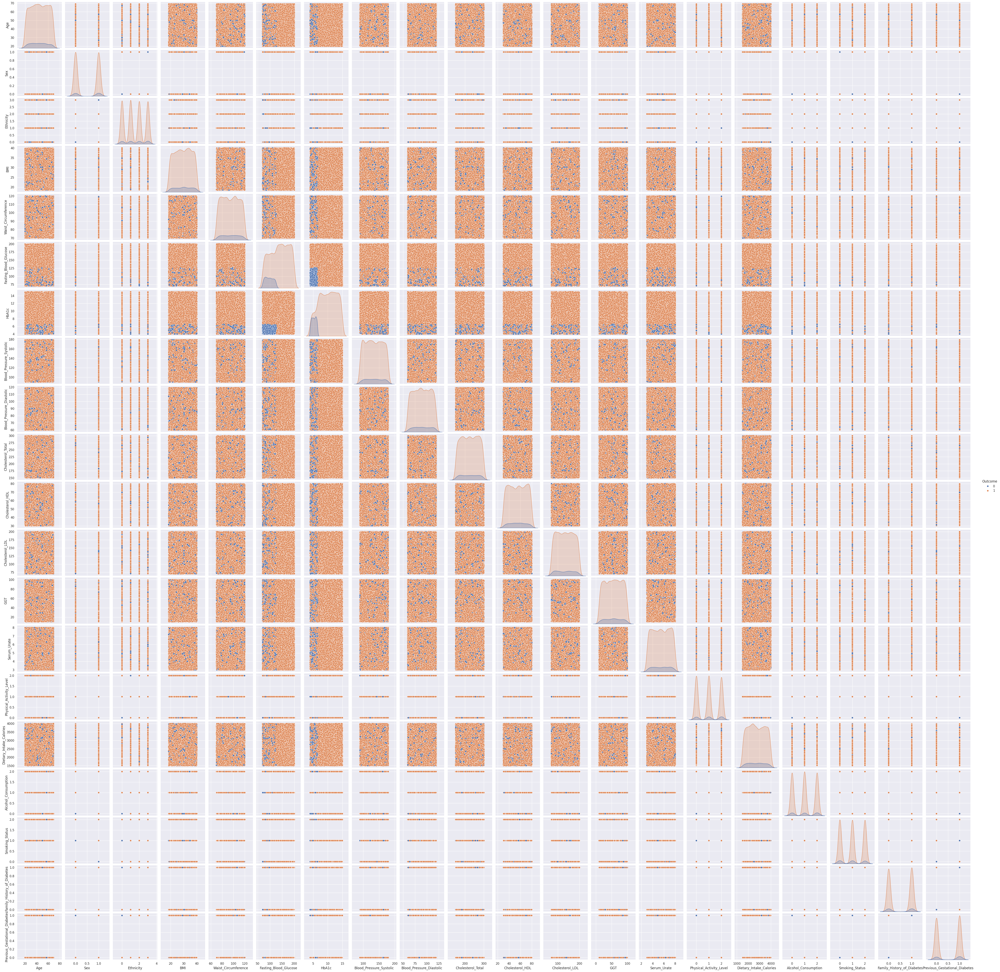

In [264]:
#visualisasi. warna dibedakan berdasarkan outcomenya apakah diabetes atau tidak
sns.pairplot(data, vars=['Age','Sex','Ethnicity','BMI','Waist_Circumference','Fasting_Blood_Glucose','HbA1c','Blood_Pressure_Systolic','Blood_Pressure_Diastolic','Cholesterol_Total','Cholesterol_HDL','Cholesterol_LDL','GGT','Serum_Urate','Physical_Activity_Level','Dietary_Intake_Calories','Alcohol_Consumption','Smoking_Status',	'Family_History_of_Diabetes','Previous_Gestational_Diabetes'], hue='Outcome')

In [265]:
import seaborn as sns
import pandas as pd

# Menghitung korelasi antara setiap variabel dengan 'Outcome'
correlation_with_outcome = data.corr()['Outcome'].sort_values(ascending=False)

# Menampilkan korelasi setiap variabel dengan 'Outcome'
print(correlation_with_outcome)

Outcome                          1.000000
HbA1c                            0.439816
Fasting_Blood_Glucose            0.327029
Cholesterol_LDL                  0.015015
Age                              0.013149
Smoking_Status                   0.011235
Unnamed: 0                       0.011079
Cholesterol_Total                0.005527
Dietary_Intake_Calories          0.004881
GGT                              0.001026
Cholesterol_HDL                  0.000779
Family_History_of_Diabetes      -0.000757
Serum_Urate                     -0.002248
Alcohol_Consumption             -0.003188
Waist_Circumference             -0.003563
Blood_Pressure_Systolic         -0.007146
BMI                             -0.007797
Sex                             -0.009067
Ethnicity                       -0.010288
Blood_Pressure_Diastolic        -0.011451
Previous_Gestational_Diabetes   -0.014657
Physical_Activity_Level         -0.015397
Name: Outcome, dtype: float64


# MEMISAHKAN VARIABEL X DAN Y

In [266]:
#memisahkan data menjadi variabel x dan y
X=data.drop(['Outcome'], axis=1)
y=data['Outcome']

# MEMBAGI DATA MENJADI DATA TRAINING DAN TESTING

In [267]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [268]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelBinarizer, LabelEncoder

# Assuming 'Sex', 'Ethnicity', 'Physical_Activity_Level', 'Alcohol_Consumption', 'Smoking_Status' are your categorical columns
categorical_cols = ['Sex', 'Ethnicity', 'Physical_Activity_Level', 'Alcohol_Consumption', 'Smoking_Status']

# Create a copy of X_train and X_test to avoid modifying the original DataFrames
X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

# Loop through each categorical column and apply Label Encoding
for col in categorical_cols:
    # Create a LabelEncoder object
    encoder = LabelEncoder()

    # Fit the encoder on the training data and transform both training and testing data
    X_train_encoded[col] = encoder.fit_transform(X_train_encoded[col])
    X_test_encoded[col] = encoder.transform(X_test_encoded[col])

# Now apply MinMaxScaler on the encoded data
X_train = MinMaxScaler().fit_transform(X_train_encoded)
X_test = MinMaxScaler().fit_transform(X_test_encoded)

print(X_train)

[[0.73904781 0.93877551 0.         ... 0.5        0.         0.        ]
 [0.92768554 0.65306122 1.         ... 0.         0.         0.        ]
 [0.29955991 0.91836735 0.         ... 0.         1.         0.        ]
 ...
 [0.32646529 0.34693878 1.         ... 0.         0.         1.        ]
 [0.98469694 0.48979592 0.         ... 1.         1.         1.        ]
 [0.27325465 0.34693878 0.         ... 1.         1.         0.        ]]


# NAIVE BAYES

In [269]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()

In [270]:
# fit train set pake Gaussian Naive Bayes
nb.fit(X_train, y_train)

GaussianNB()

In [271]:
# compute the accuracy of train set
nb.score(X_train, y_train)

0.985875

In [272]:
classif_name = ['NB']
y_predict = {}
y_predict['NB'] = nb.predict(X_test)

In [273]:
# import accuracy_score function
from sklearn.metrics import accuracy_score

for name in classif_name:
    print('{0} accuracy = {1:.4f}'.format(name, accuracy_score(y_test, y_predict[name])))

NB accuracy = 0.9885


# Proses membuat model dengan Neural Network

In [274]:
#Menguji parameter yang paling optimum untuk model

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import StratifiedKFold

cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=100)



# Tentukan parameter yang ingin diuji
parameters = {
    'hidden_layer_sizes': [(50,), (100,), (50, 30), (100, 50)],
    'learning_rate_init': [0.001, 0.01, 0.1],
    'max_iter': [100, 200, 300]
}
# Buat model MLPClassifier
clf = MLPClassifier(random_state=100)

# Inisialisasi GridSearchCV
grid_search = GridSearchCV(clf, parameters, cv=cv_strategy)
# cv merupakan jumlah lipatan validasi silang (cross-validation)

# Lakukan pencarian grid pada data training
grid_search.fit(X, y)


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=100, shuffle=True),
             estimator=MLPClassifier(random_state=100),
             param_grid={'hidden_layer_sizes': [(50,), (100,), (50, 30),
                                                (100, 50)],
                         'learning_rate_init': [0.001, 0.01, 0.1],
                         'max_iter': [100, 200, 300]})

Penentuan dan Pengujian Parameter Menggunakan GridSearchCV pada Model Neural Network (MLPClassifier)

Langkah awal dalam menggunakan GridSearchCV adalah menentukan parameter-parameter yang ingin diuji. Parameter ini disusun dalam bentuk kamus (dictionary) Python yang berisi berbagai nilai yang ingin dieksplorasi. Contohnya, kita dapat mengatur parameter seperti hidden_layer_sizes (kombinasi jumlah dan ukuran hidden layer dalam neural network), learning_rate_init (tingkat awal pembelajaran), dan max_iter (jumlah maksimum iterasi pelatihan). Parameter-parameter ini sangat memengaruhi performa akhir model, karena berhubungan langsung dengan arsitektur dan proses belajar jaringan saraf.

Selanjutnya, proses dimulai dengan inisialisasi model menggunakan MLPClassifier() dari library scikit-learn, yang merupakan implementasi dari Multi-Layer Perceptron, salah satu jenis Neural Network untuk klasifikasi. Pada tahap awal ini, model dapat diinisialisasi tanpa parameter khusus atau dengan parameter default.

Untuk menjaga konsistensi hasil pada setiap eksekusi kode, sangat disarankan menambahkan argumen random_state baik pada MLPClassifier maupun GridSearchCV. random_state berfungsi sebagai penentu seed bagi operasi yang mengandung elemen acak, seperti inisialisasi bobot jaringan atau pembagian data dalam cross-validation. Dengan menetapkan random_state, hasil yang diperoleh menjadi reprodusibel. Nilainya tidak harus 100, namun harus konsisten bila ingin membandingkan hasil eksperimen yang sama (Geron, 2019).

Tahap berikutnya adalah membangun objek GridSearchCV, yang dirancang untuk mencari kombinasi parameter terbaik berdasarkan validasi silang (cross-validation). Parameter cv=5 mengindikasikan bahwa proses validasi silang dilakukan dalam 5 lipatan (5-fold cross-validation), di mana data pelatihan dibagi menjadi lima bagian: empat bagian digunakan untuk pelatihan dan satu bagian untuk validasi, dilakukan bergantian lima kali.

Proses pencarian dilakukan dengan memanggil metode fit() pada objek GridSearchCV, seperti grid_search.fit(X, y). Di sini, X mewakili fitur atau input, dan y merupakan target atau label. GridSearchCV akan menguji semua kombinasi parameter yang telah didefinisikan, melatih model pada masing-masing kombinasi, dan mengevaluasinya berdasarkan metrik tertentu seperti akurasi, precision, atau recall.

Setelah proses selesai, kombinasi parameter terbaik yang menghasilkan performa tertinggi dapat diakses melalui atribut best_params_. Atribut ini menampilkan konfigurasi optimal yang ditemukan selama pencarian grid, dan dapat digunakan untuk membangun model akhir dengan performa yang telah dioptimalkan.

Menurut Raschka dan Mirjalili (2020), penggunaan GridSearchCV merupakan metode yang sangat bermanfaat dalam hyperparameter tuning, terutama saat bekerja dengan model kompleks seperti Neural Networks, karena dapat mengotomatisasi proses pencarian konfigurasi terbaik secara sistematis dan menyeluruh

In [275]:
# Tampilkan parameter terbaik
print("Parameter terbaik:", grid_search.best_params_)

Parameter terbaik: {'hidden_layer_sizes': (100, 50), 'learning_rate_init': 0.01, 'max_iter': 100}


In [276]:
from sklearn.neural_network import MLPClassifier

clf = MLPClassifier(hidden_layer_sizes=(50,),learning_rate_init=0.1,max_iter=100)

clf.fit(X_train, y_train)

MLPClassifier(hidden_layer_sizes=(50,), learning_rate_init=0.1, max_iter=100)

Kode yang digunakan memanfaatkan MLPClassifier dari pustaka Scikit-Learn untuk membangun dan melatih model jaringan saraf tiruan (Artificial Neural Network) jenis Multi-Layer Perceptron (MLP). Model ini dirancang untuk melakukan tugas klasifikasi dengan meniru cara kerja otak manusia melalui jaringan node (neuron) yang terhubung.

Dalam implementasi ini, model MLPClassifier dikonfigurasi menggunakan beberapa parameter penting yang ditentukan secara manual, yaitu:

hidden_layer_sizes=(50,): Parameter ini mengatur struktur jaringan saraf, tepatnya jumlah dan ukuran layer tersembunyi (hidden layer). Notasi (50,) menunjukkan bahwa model memiliki satu layer tersembunyi yang berisi 50 neuron. Semakin banyak neuron dalam hidden layer, maka model memiliki kapasitas belajar yang lebih besar, tetapi juga berisiko overfitting jika tidak diimbangi dengan data yang cukup (Geron, 2019).

learning_rate_init=0.1: Ini adalah tingkat pembelajaran awal yang digunakan selama proses pelatihan. Nilai ini menentukan seberapa besar penyesuaian bobot dilakukan berdasarkan kesalahan pada setiap iterasi. Nilai learning rate yang terlalu besar dapat menyebabkan model gagal konvergen, sedangkan nilai yang terlalu kecil membuat proses pelatihan menjadi lambat (Goodfellow et al., 2016).

max_iter=100: Menunjukkan jumlah maksimum iterasi atau epoch yang diizinkan selama proses pelatihan. Jika model belum konvergen dalam jumlah iterasi tersebut, maka pelatihan akan dihentikan. Ini merupakan cara untuk mengendalikan waktu pelatihan dan mencegah looping tak berujung jika model tidak stabil.

Proses pelatihan dilakukan menggunakan data training, di mana model belajar untuk mengenali pola-pola dari fitur input yang berkaitan dengan label atau target yang diberikan. Selama pelatihan, model akan memperbarui bobot-bobot koneksi antar neuron menggunakan algoritma backpropagation untuk meminimalkan error.

Menurut Raschka & Mirjalili (2020), konfigurasi awal dari parameter seperti struktur hidden layer dan learning rate sangat krusial untuk performa model MLP. Penyesuaian parameter ini sering kali dilakukan dengan eksperimen manual atau melalui teknik optimasi seperti Grid Search untuk mencapai hasil klasifikasi terbaik.

In [277]:
y_pred = clf.predict(X_test)

In [278]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       190
           1       1.00      1.00      1.00      1810

    accuracy                           1.00      2000
   macro avg       0.99      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000



In [280]:
from sklearn.metrics import accuracy_score

round(accuracy_score(y_test,y_pred),3)

0.999

Output 0.999 yang dihasilkan menunjukkan tingkat akurasi dari model klasifikasi yang dilatih. Angka 0.989 berarti model berhasil memprediksi dengan benar sekitar 99.9% dari semua sample pada data uji.

# K-NEAREST NEIGHBORS

Pemisahan (Split) Dataset: Pengertian dan Proporsi Ideal

Dalam proses machine learning, salah satu tahap krusial adalah membagi dataset menjadi dua bagian utama, yaitu data training dan data testing. Tujuan dari pembagian ini adalah untuk memastikan bahwa model yang dibangun tidak hanya bekerja baik pada data yang sudah dilatih, tetapi juga mampu mengeneralisasi pola-pola pada data baru yang belum pernah dilihat sebelumnya.

Data training adalah bagian dari dataset yang digunakan untuk melatih model agar dapat mengenali hubungan antara fitur (variabel input) dan target (variabel output). Selama proses pelatihan, model belajar dari data ini untuk membentuk pemahaman atau pola yang akan digunakan dalam proses prediksi. Menurut Brownlee (2019), data training berfungsi sebagai fondasi utama dalam pembentukan model, karena semua penyesuaian parameter dilakukan berdasarkan data ini.

Sebaliknya, data testing berfungsi untuk mengukur seberapa baik model dapat mengeneralisasi prediksinya terhadap data yang tidak dikenali sebelumnya. Data testing tidak pernah digunakan selama proses pelatihan agar evaluasi kinerja model lebih objektif. Pengujian ini memungkinkan pengembang untuk mengetahui apakah model mengalami overfitting (terlalu cocok dengan data training) atau underfitting (kurang belajar dari data).

Proporsi Pembagian Dataset

Tidak ada aturan baku terkait pembagian data training dan testing, namun praktik umum yang sering diterapkan adalah:

80:20 → 80% data digunakan untuk melatih model, dan 20% sisanya digunakan untuk menguji kinerjanya. Ini adalah salah satu rasio yang paling populer dan dianggap seimbang untuk banyak kasus.

70:30 → Kadang digunakan jika datasetnya tidak terlalu besar, agar data testing lebih banyak untuk evaluasi.

90:10 atau 95:5 → Cocok untuk dataset yang sangat besar, karena model tetap dapat belajar dengan baik dari data training yang melimpah.

Dalam praktik ini, pembagian data dilakukan dengan rasio 80:20, artinya 80% dari seluruh data digunakan untuk melatih model, sedangkan 20% digunakan untuk menguji kinerjanya. Proporsi ini memberikan keseimbangan antara kebutuhan model untuk belajar dan evaluasi performa terhadap data baru.

In [281]:
from sklearn.model_selection import train_test_split

X = data.drop('Outcome', axis=1)
y = data['Outcome']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [282]:
print(f'Total # of sample in whole dataset: {len(X)}')
print(f'Total # of sample in train dataset: {len(X_train)}')
print(f'Total # of sample in test dataset: {len(X_test)}')

Total # of sample in whole dataset: 10000
Total # of sample in train dataset: 8000
Total # of sample in test dataset: 2000


In [283]:
print(X_train)

      Unnamed: 0  Age  Sex  Ethnicity   BMI  Waist_Circumference  \
9254        9254   59    0          2  32.6                 93.3   
1561        1561   67    1          3  30.2                 89.3   
1670        1670   62    0          1  21.5                 89.4   
6087        6087   38    1          0  35.1                 90.9   
6669        6669   60    0          1  24.0                 86.0   
...          ...  ...  ...        ...   ...                  ...   
5734        5734   57    0          1  23.4                 82.7   
5191        5191   27    0          1  30.8                102.3   
5390        5390   59    1          0  26.1                 87.6   
860          860   61    1          1  23.7                119.3   
7270        7270   53    1          1  38.7                 94.9   

      Fasting_Blood_Glucose  HbA1c  Blood_Pressure_Systolic  \
9254                  113.7   12.9                      110   
1561                  174.1    7.1                      1

In [284]:
print(y_train)

9254    1
1561    1
1670    1
6087    0
6669    1
       ..
5734    1
5191    1
5390    1
860     1
7270    0
Name: Outcome, Length: 8000, dtype: int64


In [285]:
print(X_test)

      Unnamed: 0  Age  Sex  Ethnicity   BMI  Waist_Circumference  \
6252        6252   50    1          1  27.7                107.9   
4684        4684   25    1          3  27.6                 85.5   
1731        1731   56    1          3  35.3                 83.8   
4742        4742   54    0          3  39.8                 74.9   
4521        4521   50    0          3  32.0                 84.9   
...          ...  ...  ...        ...   ...                  ...   
6412        6412   36    1          3  37.6                114.7   
8285        8285   38    0          2  35.9                104.7   
7853        7853   41    0          0  27.4                 83.0   
1095        1095   20    1          2  37.9                101.3   
6929        6929   40    1          1  18.8                118.4   

      Fasting_Blood_Glucose  HbA1c  Blood_Pressure_Systolic  \
6252                  172.6   14.3                      149   
4684                   95.8   13.3                      1

In [286]:
print(y_test)

6252    1
4684    1
1731    1
4742    0
4521    1
       ..
6412    1
8285    1
7853    1
1095    1
6929    1
Name: Outcome, Length: 2000, dtype: int64


# Feature Scaling

In [287]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [288]:
print(X_train)

[[ 1.4692775   0.99612713 -1.00677294 ...  1.2296196  -1.01969389
   0.97335485]
 [-1.19499359  1.55152706  0.99327263 ... -1.223181   -1.01969389
   0.97335485]
 [-1.15724427  1.20440211 -1.00677294 ...  0.0032193   0.98068647
   0.97335485]
 ...
 [ 0.13108128  0.99612713  0.99327263 ... -1.223181   -1.01969389
   0.97335485]
 [-1.43776677  1.13497712  0.99327263 ...  1.2296196   0.98068647
   0.97335485]
 [ 0.78217054  0.57957718  0.99327263 ...  1.2296196  -1.01969389
  -1.02737455]]


In [289]:
print(X_test.dtype)

float64


# Training the K-NN model on the Training set

In [290]:
from math import sqrt
class KNN():
  def __init__(self,k):
    self.k=k
    print(self.k)
  def fit(self,X_train,y_train):
    self.x_train=X_train
    self.y_train=y_train
  def calculate_euclidean(self,sample1,sample2):
    distance=0.0
    for i in range(len(sample1)):
      distance+=(sample1[i]-sample2[i])**2 #Euclidean Distance = sqrt(sum i to N (x1_i-x2_i)^2)
    return sqrt(distance)
  def nearest_neighbors(self,test_sample):
    distances=[] #calculate distances from a test sample to every sample in a training set
    for i in range(len(self.x_train)):
      distances.append((self.y_train[i],self.calculate_euclidean(self.x_train[i],test_sample)))
    distances.sort(key=lambda x:x[1]) #sort in ascending order, based on a distance value
    neighbors=[]
    for i in range(self.k): #get fist k samples
      neighbors.append(distances[i][0])
    return neighbors
  def predict(self,test_set):
    predictions=[]
    for test_sample in test_set:
      neigbors=self.nearest_neighbors(test_sample)
      labels=[sample for sample in neighbors]
      prediction=max(labels,key=labels.count)
      predictions.append(prediction)
    return predictions

In [291]:
model=KNN(5)
model.fit(X_train,y_train)

5


In [292]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2) #The default metric is minkowski, and with p=2 is equivalent to the standard Euclidean metric
classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [293]:
model = []
model.append(('KNN', KNeighborsClassifier()))

**Prediksi KNN berdasarkan model yang dibangun**

In [294]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error

#definisikan nilai K dan buat objek KNN regressor
k = 3
knn = KNeighborsRegressor(n_neighbors=k)

#fitkan model KNN ke data train
knn.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=3)

In [295]:
# Lakukan prediksi pada data train dan dataset
y_pred_train = knn.predict(X_train)
y_pred_test = knn.predict(X_test)

In [296]:
#Hitung MSE untuk data train dan data test
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)

In [297]:
print("MSE data train:", mse_train)
print("MSE data test:", mse_test)

MSE data train: 0.03504166666666667
MSE data test: 0.06605555555555556


**Hasil Prediksi berdasarkan perhitungan Mean Squared Error**


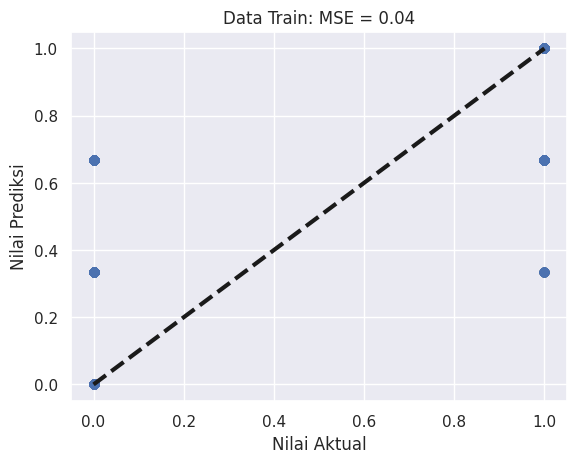

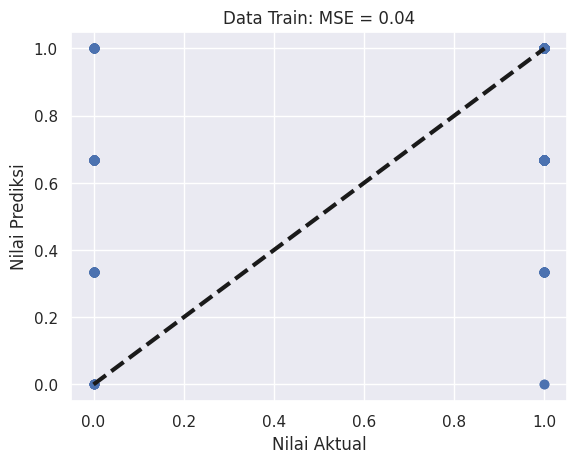

In [298]:
import matplotlib.pyplot as plt

# Plot data train
plt.scatter(y_train, y_pred_train)
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'k--', lw=3)
plt.xlabel('Nilai Aktual')
plt.ylabel('Nilai Prediksi')
plt.title('Data Train: MSE = %.2f' % mse_train)
plt.show()

# Plot dataset
plt.scatter(y_test, y_pred_test)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--', lw=3)
plt.xlabel('Nilai Aktual')
plt.ylabel('Nilai Prediksi')
plt.title('Data Train: MSE = %.2f' % mse_train)
plt.show()

**Hasil evaluasi (nilai akurasi Algoritma KNN) dan Confusion Matriks**

In [299]:
y_pred = classifier.predict(X_test)

In [300]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[  45  146]
 [  19 1790]]


0.9175

In [301]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[  45  146]
 [  19 1790]]


0.9175

Berdasarkan hasil evaluasi, model klasifikasi KNN menunjukkan akurasi sebesar 0.9175, yang berarti mampu memprediksi dengan benar sekitar 91.75% data uji. Angka ini lebih rendah dibandingkan dengan model Naive Bayes yang menghasilkan akurasi sebesar 99.9%. Dengan demikian, dapat disimpulkan bahwa dalam skenario ini, algoritma Naive Bayes memberikan hasil klasifikasi yang lebih akurat dibandingkan dengan KNN.